In [165]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
import branca
import geopandas
import warnings
warnings.filterwarnings("ignore")

from IPython.display import display
from folium.plugins import TimeSliderChoropleth, HeatMapWithTime
from sklearn.preprocessing import minmax_scale

In [3]:
data = pd.read_csv("train.csv")
print(data.shape)

(17324, 8)


In [11]:
provinces = data['Province/State'].unique()
countries = data['Country/Region'].unique()

# 1. Fatalities and Confirmed cases by Provinces

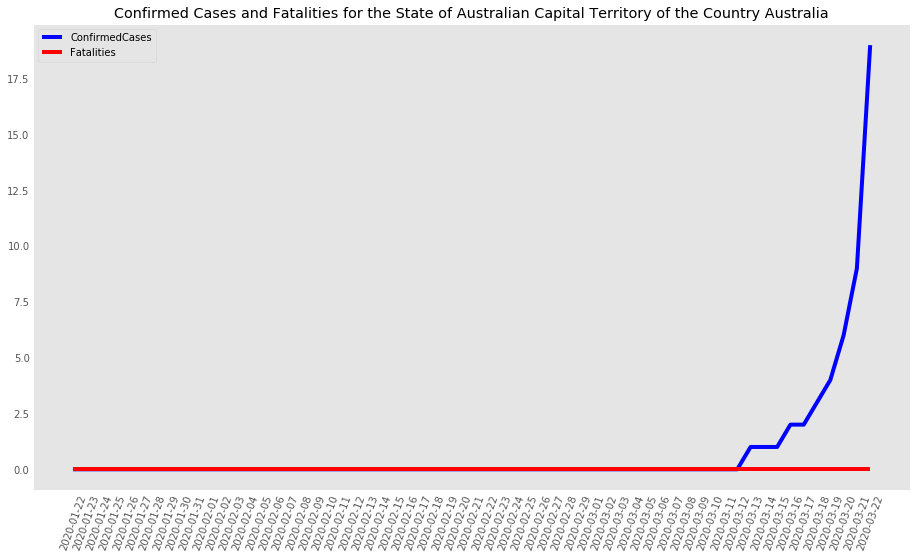

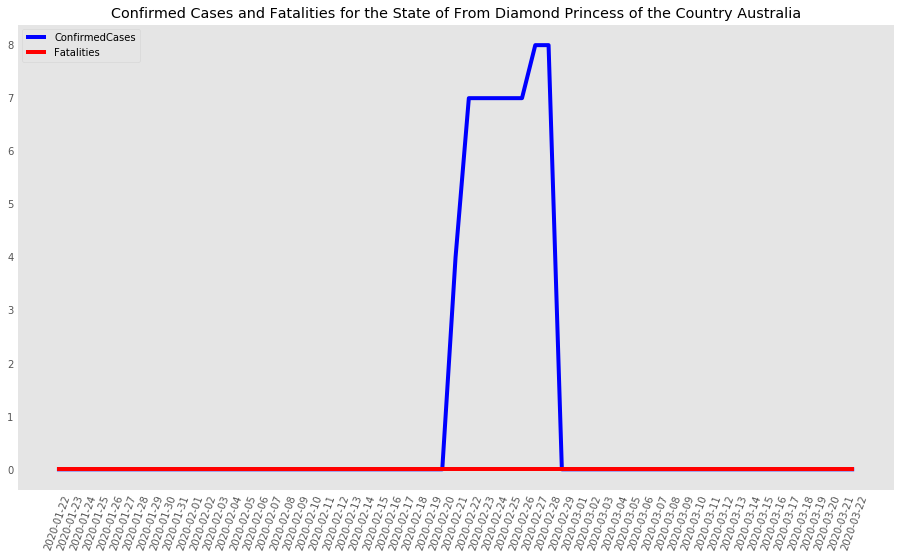

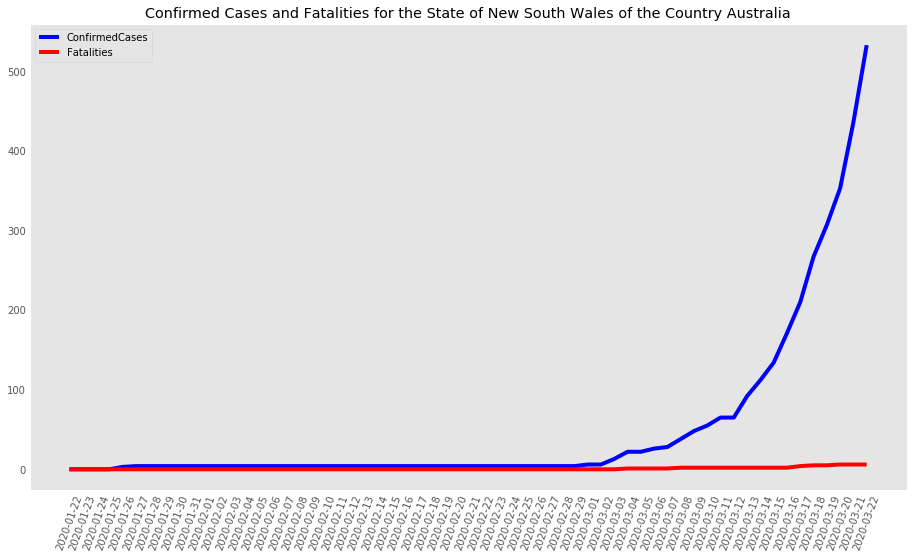

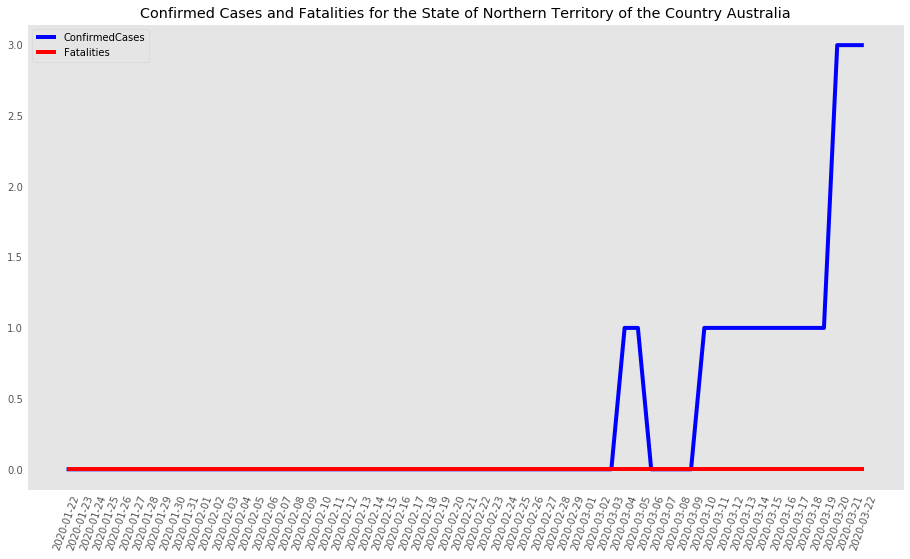

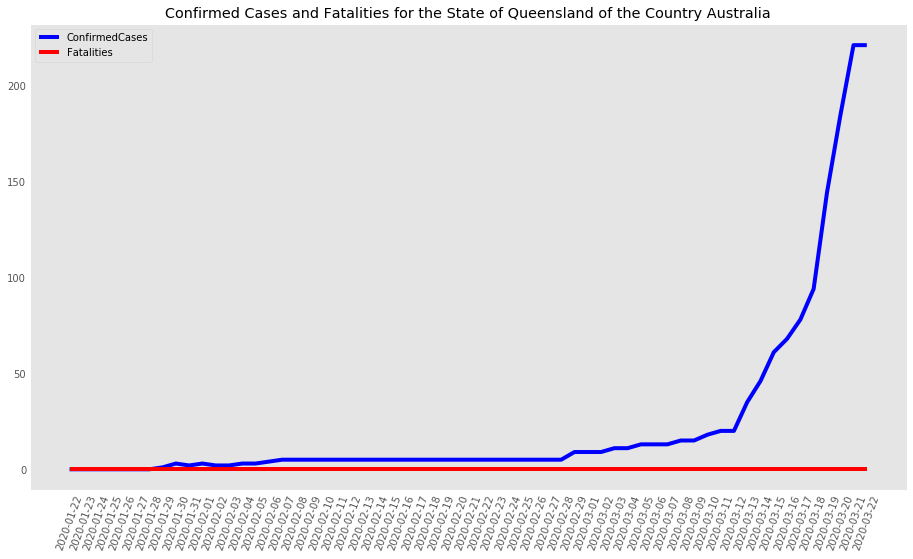

...

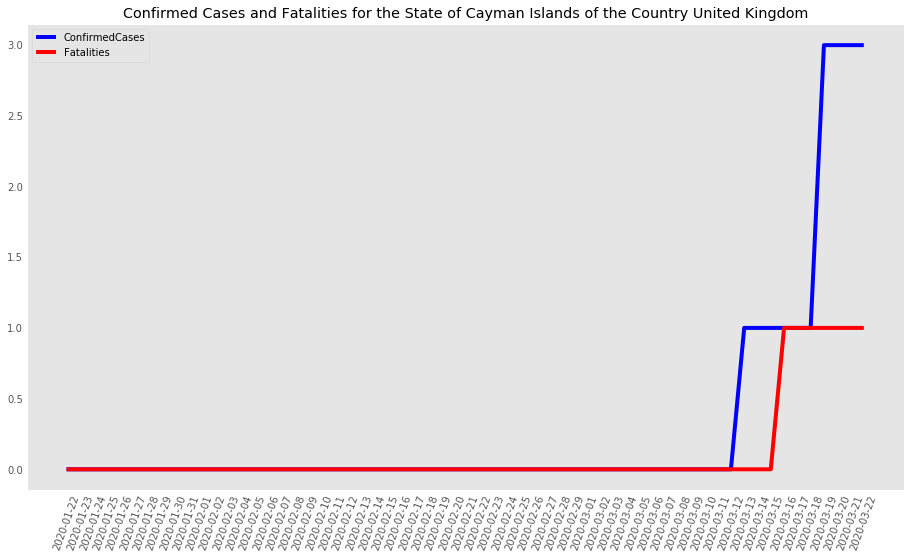

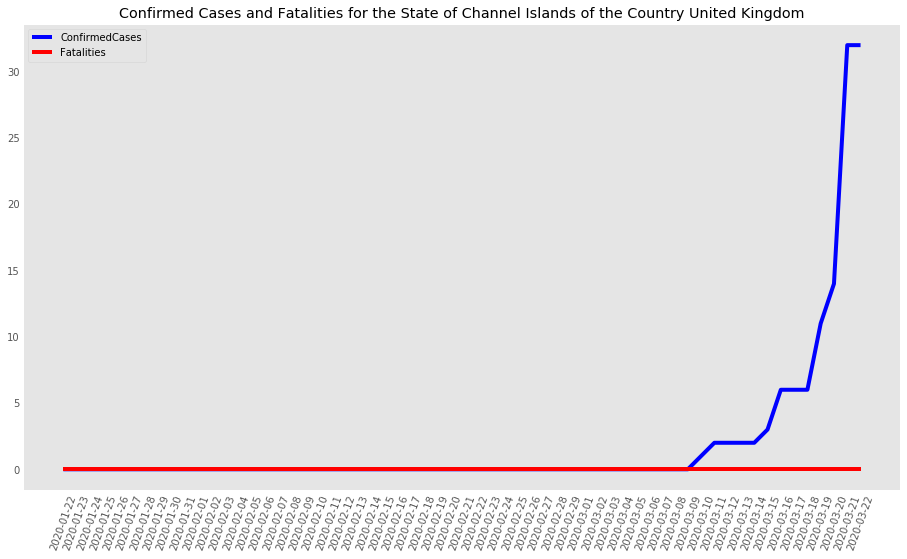

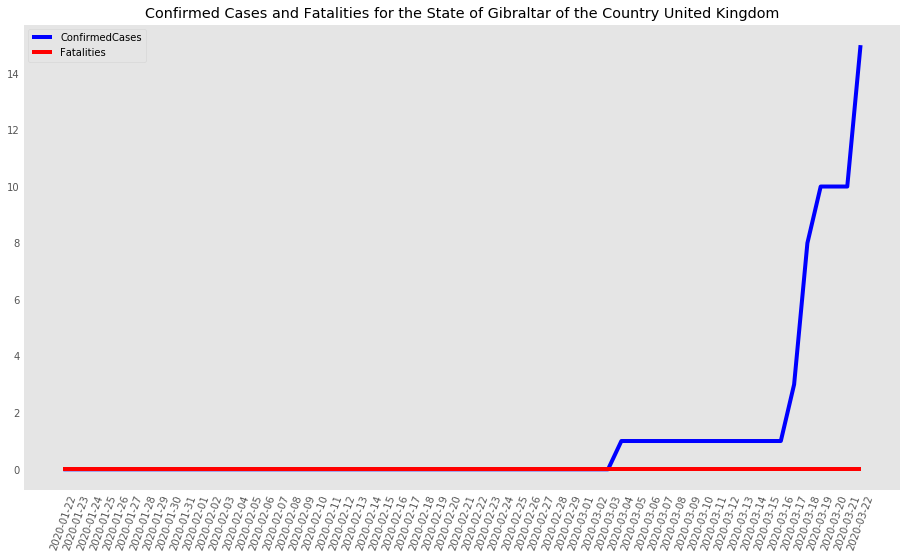

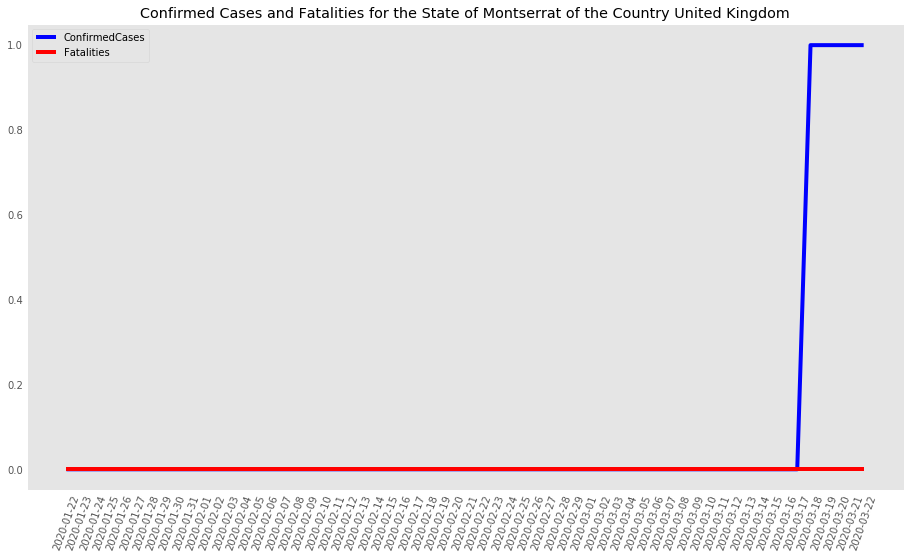

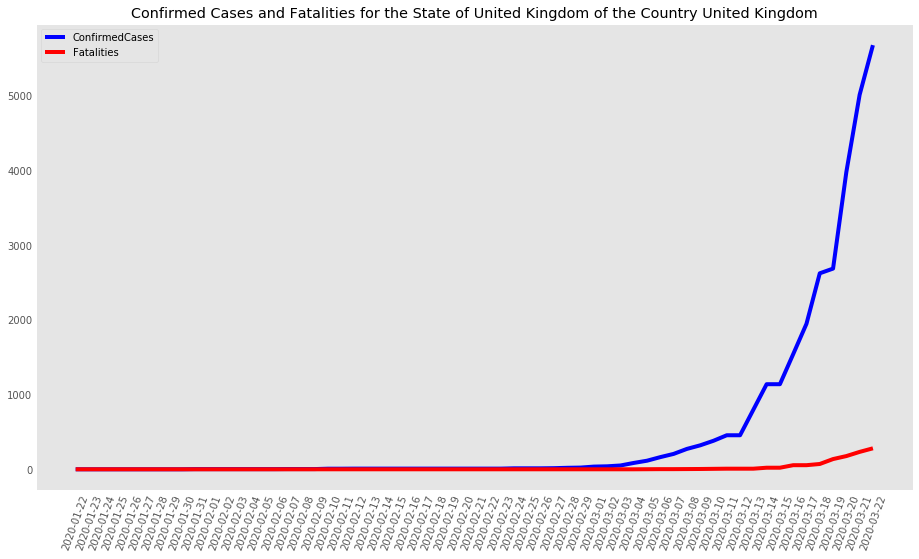

In [67]:
dt_provinces = data[data['Province/State'].isna() == False]
provinces = dt_provinces['Province/State'].unique()
for p in provinces[1:]:
    t = dt_provinces[dt_provinces['Province/State'] == p]
    cty = t['Country/Region'].unique()[0]
    plt.figure(figsize = (14,8))
    plt.style.use('ggplot')
    plt.plot("Date", "ConfirmedCases", data=t, color="blue")
    plt.plot("Date", "Fatalities", data=t, color="red")
    plt.xticks(rotation=70)
    plt.grid(False)
    plt.legend(loc = 'upper left', labels = ["ConfirmedCases", "Fatalities"])
    plt.title(f"Confirmed Cases and Fatalities for the State of {p} of the Country {cty}")
    plt.show()

# 2. Fatalities and confirmed cases by Country

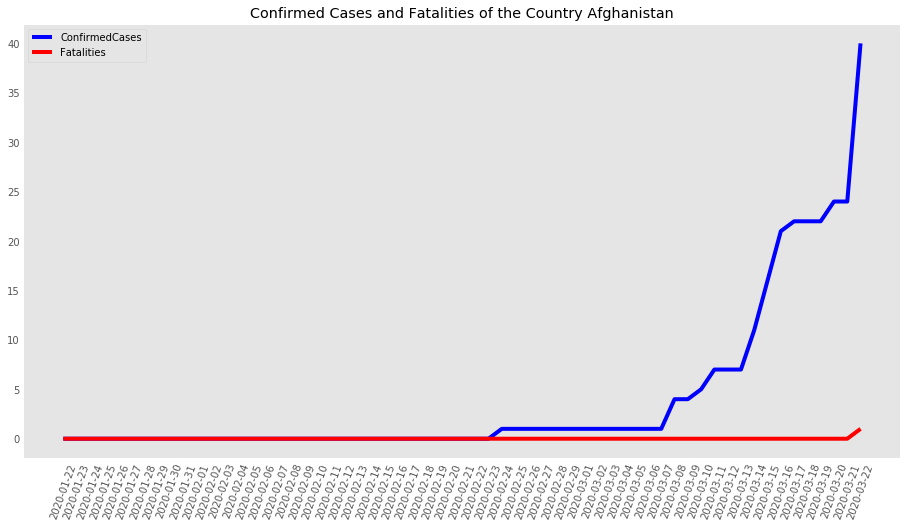

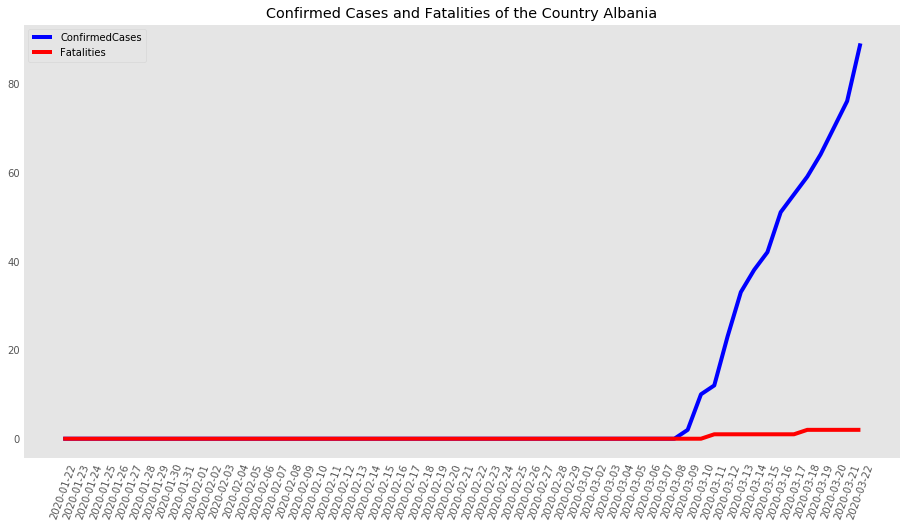

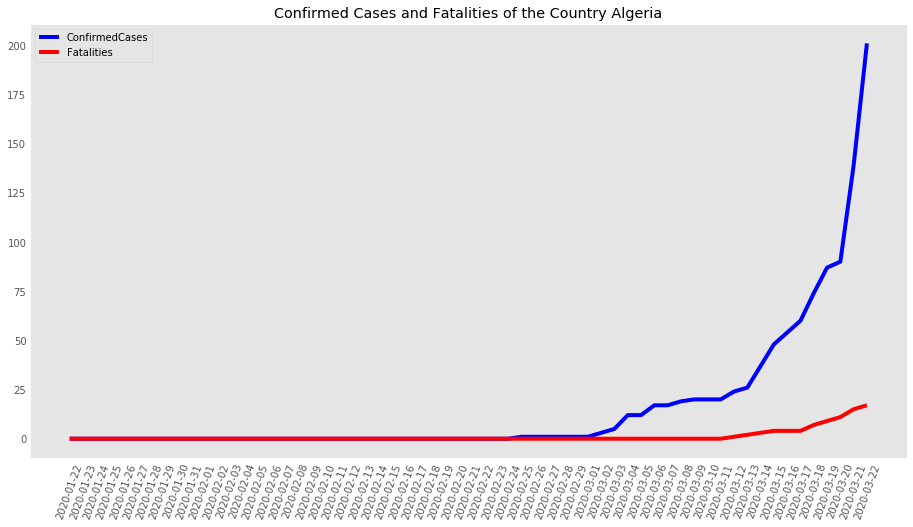

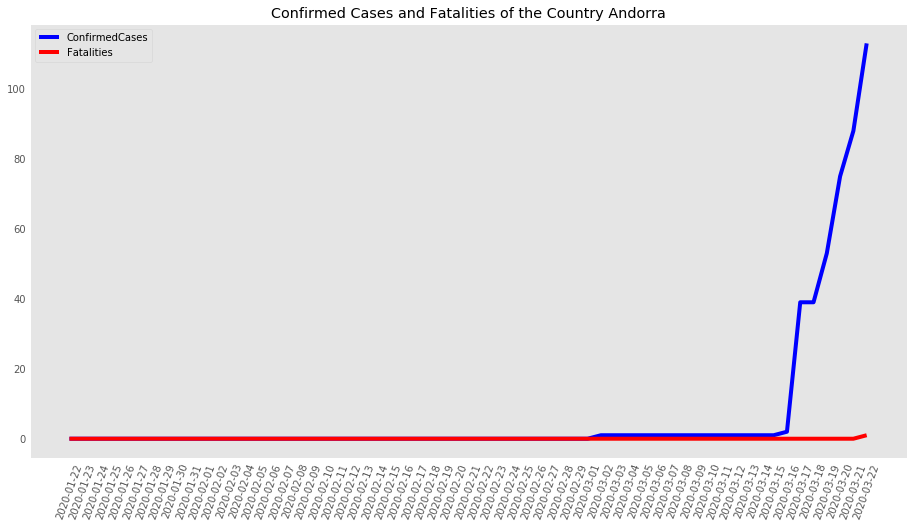

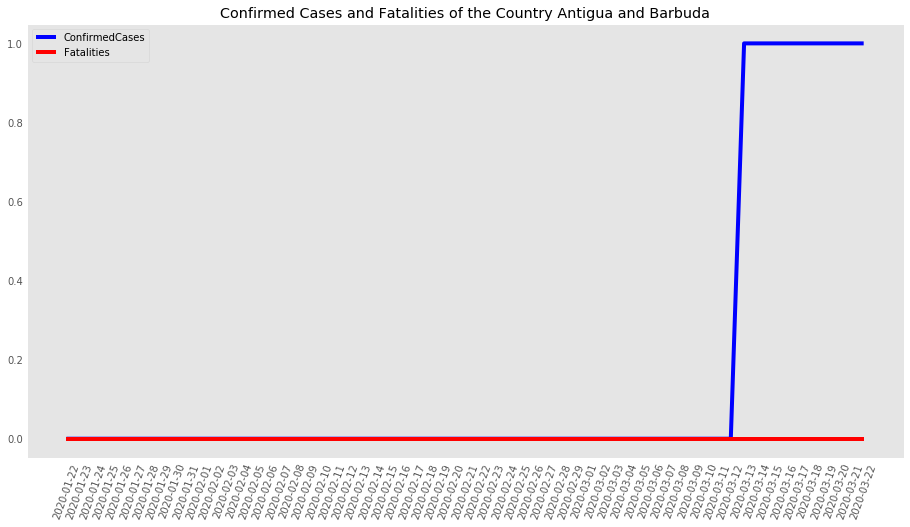

...

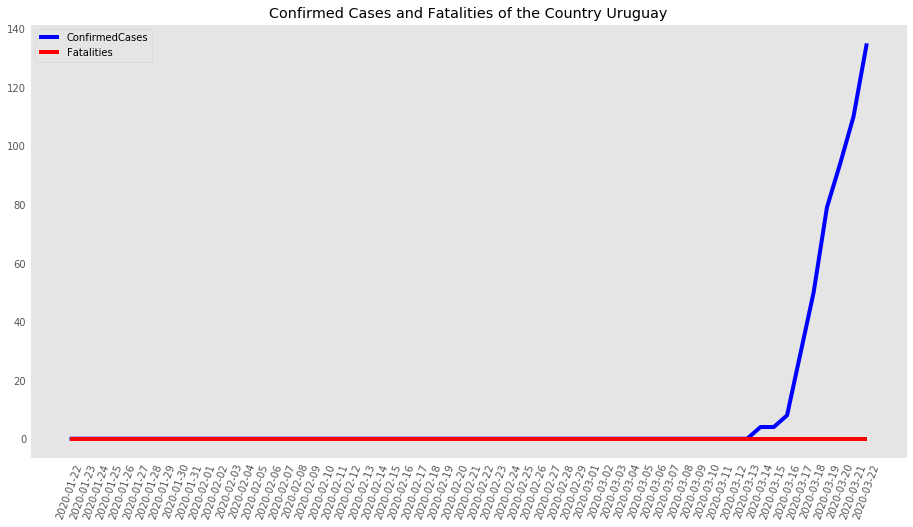

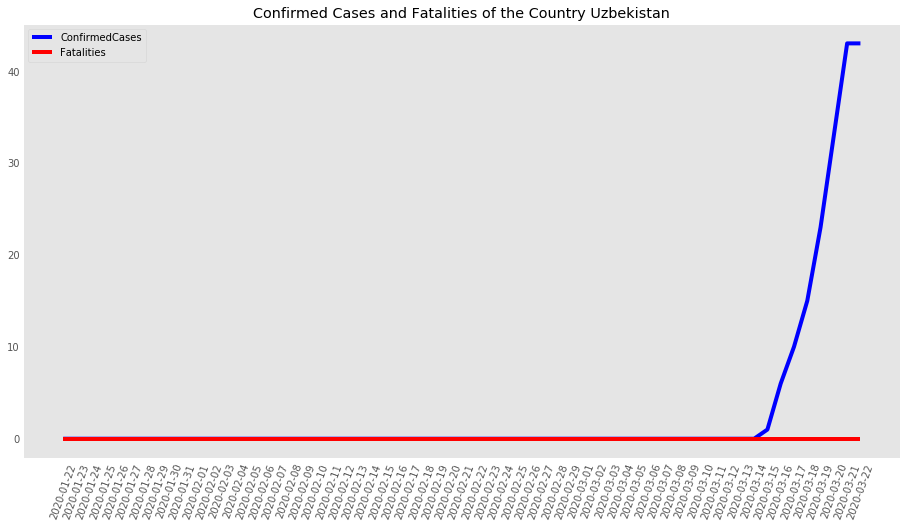

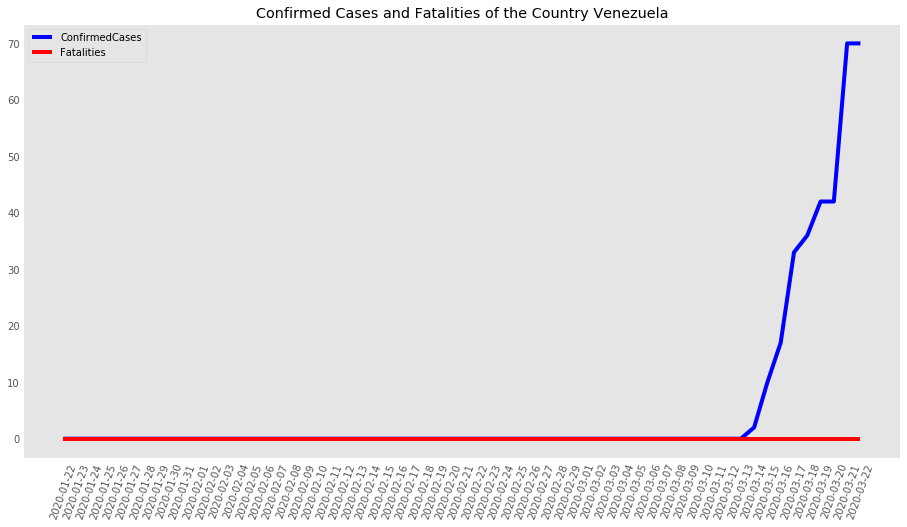

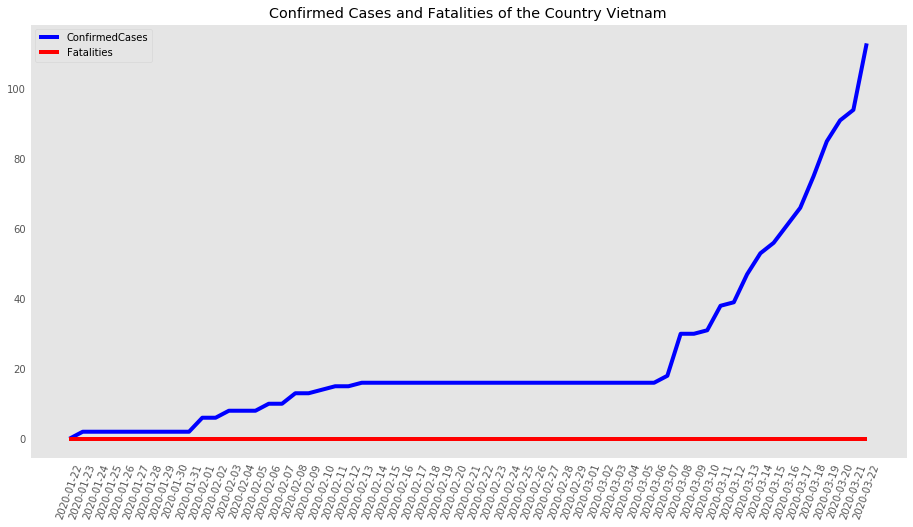

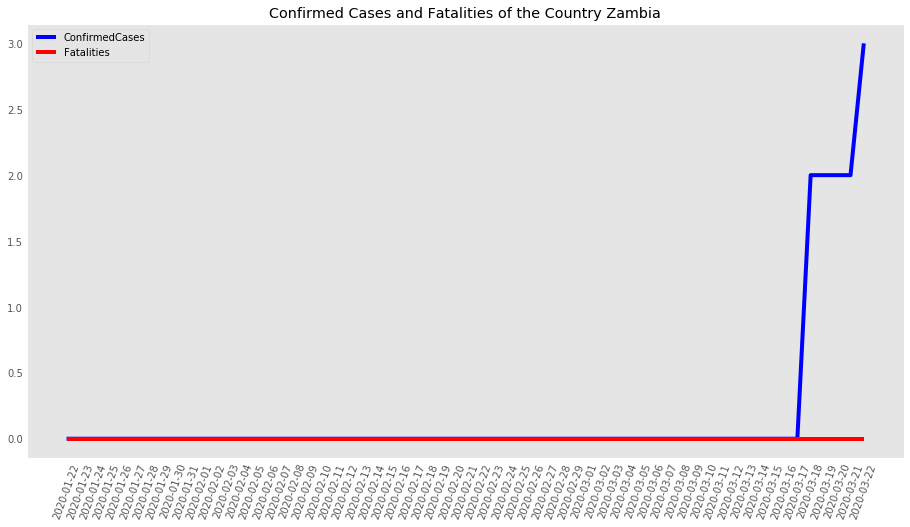

In [74]:
dt_countries = data[data['Province/State'].isna()]
countries = dt_countries['Country/Region'].unique()
for c in countries:
    t = dt_countries[dt_countries['Country/Region'] == c]
    plt.figure(figsize = (14,8))
    plt.style.use('ggplot')
    plt.plot("Date", "ConfirmedCases", data=t, color="blue")
    plt.plot("Date", "Fatalities", data=t, color="red")
    plt.xticks(rotation=70)
    plt.grid(False)
    plt.legend(loc = 'upper left', labels = ["ConfirmedCases", "Fatalities"])
    plt.title(f"Confirmed Cases and Fatalities of the Country {c}")
    plt.show()

# Daily Visualization

In [160]:
# Data
today = dt_countries[dt_countries.Date == dt_countries['Date'].max()]
today['bin'] = pd.cut(today["ConfirmedCases"], bins = 25, labels = range(1,26))

# Folium map
folium_map = folium.Map(location=[20, 0],
                        tiles="OpenStreetMap")

# Add size of points according to ConfirmedCases
for i in range(today.Lat.size):
    marker = folium.CircleMarker(location=[today["Lat"].values[i],today["Long"].values[i]],
                                 radius= today["bin"].values[i],
                                 color="blue",
                                 fill=True)
    marker.add_to(folium_map)

folium_map

# Heatmap with Time

In [238]:
dt_countries['bin'] = pd.cut(dt_countries["ConfirmedCases"], bins = 30, labels = range(1,31))

# Create Data for HeatMap
date_list = []
for date in dt_countries['Date'].sort_values().unique():
    dt = dt_countries[dt_countries['Date'] == date]
    dt['Cases_normalized'] = minmax_scale(dt['ConfirmedCases'], feature_range = (0,1)) + 0.1
    date_list.append(dt[['Lat', 'Long', 'Cases_normalized']].groupby(['Lat', 'Long']).sum().reset_index().values.tolist())

In [239]:
# Plot HeatMap
heat_map = folium.Map(location=[30, 45],
                      control_scale=True,
                      tiles="OpenStreetMap")

hmwt = HeatMapWithTime(date_list, 
                       radius=5, 
                       min_opacity=0.3, 
                       max_opacity=.5,
                       use_local_extrema=True,
                       display_index=True)

hmwt.add_to(heat_map)
heat_map